In [1]:
import importlib
from gal_goku import plot
importlib.reload(plot)
import numpy as np


train_subdir = "train_nflow"
norm_type = "subtract_mean"
data_dir = "/home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/"
z = 2.5
noise_floor = 0

sims = np.arange(36)

plot_xi_emu = plot.PlotXiEmu( data_dir=data_dir, 
                              sims=sims, 
                              z=z,
                              train_subdir=train_subdir)

halo_tools not available, won't be able to use propagator.
Processing simulation 1/36
[timer] predict: load attrs 0.00s
[timer] predict: build/restore model 0.79s (device=cpu)
[timer] predict: load checkpoint 0.16s
samples.shape: (1, 64, 2730)
[timer] predict: sampling + moments 64.81s (num_samples=64)
Processing simulation 2/36
[timer] predict: load attrs 0.00s
[timer] predict: build/restore model 0.00s (device=cpu)
[timer] predict: load checkpoint 0.14s
samples.shape: (1, 64, 2730)
[timer] predict: sampling + moments 64.92s (num_samples=64)
Processing simulation 3/36
[timer] predict: load attrs 0.00s
[timer] predict: build/restore model 0.00s (device=cpu)
[timer] predict: load checkpoint 0.09s
samples.shape: (1, 64, 2730)
[timer] predict: sampling + moments 64.58s (num_samples=64)
Processing simulation 4/36
[timer] predict: load attrs 0.00s
[timer] predict: build/restore model 0.00s (device=cpu)
[timer] predict: load checkpoint 0.11s
samples.shape: (1, 64, 2730)
[timer] predict: samp

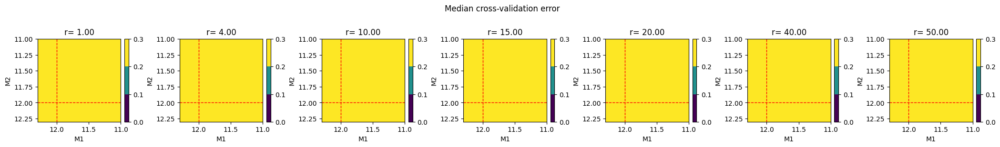

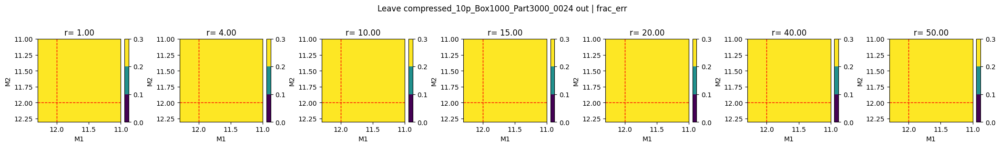

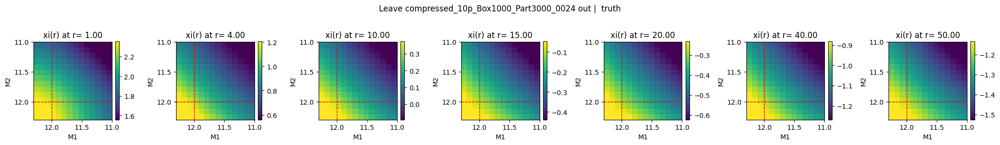

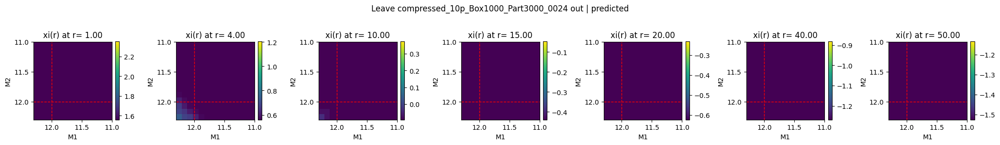

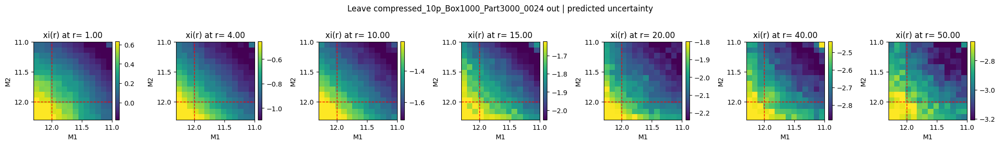

...

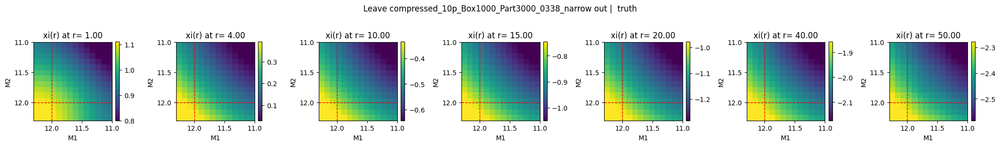

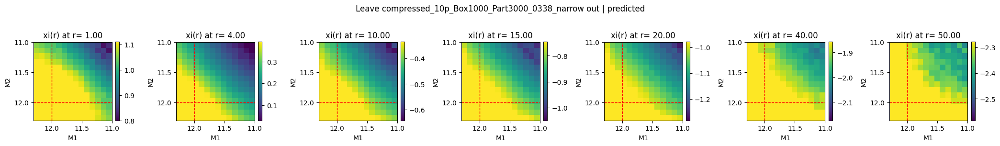

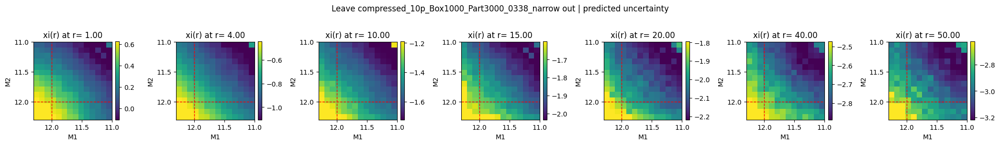

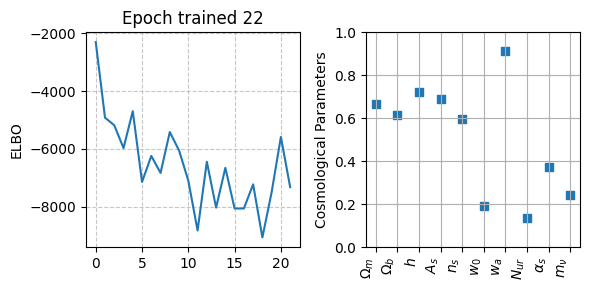

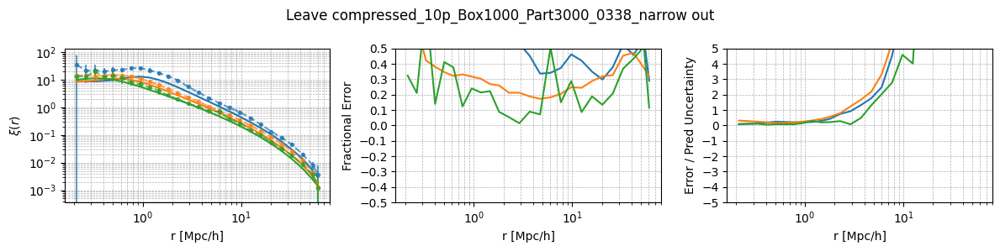

In [2]:
plot_xi_emu.cross_valid_2d_errs(mass_range=(12.3, 11.0))

In [6]:
import importlib
from gal_goku import emus_multifid
importlib.reload(emus_multifid)
import numpy as np

In [7]:
train_subdir = "train_nflow"
norm_type = "subtract_mean"
data_dir = "/home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/"
z = 2.5
noise_floor = 0
emu = emus_multifid.XiNativeBins(data_dir=data_dir,
                                     z=z,
                                     norm_type=norm_type,
                                     noise_floor=noise_floor,
                                     logging_level='ERROR')

/home/qezlou/HD2/HETDEX/cosmo/pack_dev/private-gal-emu/src/gal_goku/gal_goku/summary_stats.py:1132: RuntimeWarning: invalid value encountered in log10
  log_corr = np.log10(self.xi[:,:,ind_r]).squeeze()


In [ ]:
import numpy as np
ind_test = np.array([12, 23, 35])
model_file = "xi_emu_combined_z2.5_leave0.pt"
mean_pred, var_pred = emu.predict(ind_test=ind_test,
                                model_file=model_file,
                                train_subdir=train_subdir,
                                num_samples=64)

[timer] predict: load attrs 0.00s
[timer] predict: build/restore model 0.06s (device=cpu)
[timer] predict: load checkpoint 0.08s
samples.shape: (3, 1, 2730)
[timer] predict: sampling + moments 20.78s (num_samples=1)


In [10]:
mean_pred.shape

(3, 2730)

In [16]:
yerr = np.sqrt(var_pred)*10**mean_pred*np.log(10)

In [5]:
ind_test

array([35])

(-3.0, 3.0)

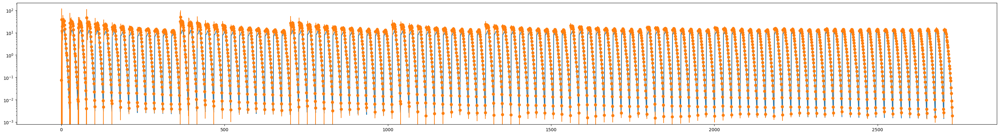

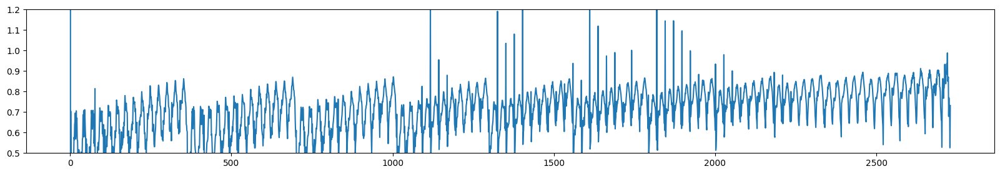

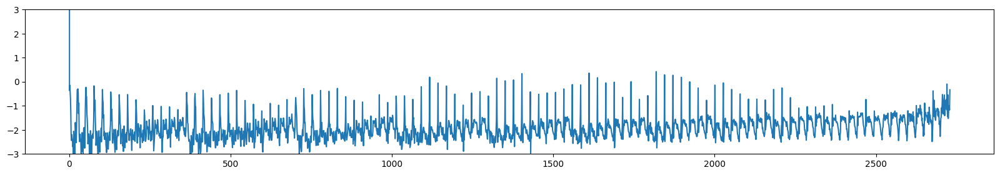

In [25]:
from matplotlib import pyplot as plt

ind_bins = np.arange(mean_pred.shape[0])

fig, ax = plt.subplots(1,1, figsize=(40,5))
ax.plot(ind_bins, 10**mean_pred[ind_bins], label='Predicted median', color='C1')
ax.plot(ind_bins, 10**emu.Y_raw[1][ind_test[0]][ind_bins], label='True', color='C0')
ax.errorbar(ind_bins, 10**mean_pred[ind_bins], yerr=yerr[ind_bins], fmt='o', label='Predicted', color='C1')
ax.set_yscale('log')

fig, ax = plt.subplots(1,1, figsize=(20,3))
ax.plot(ind_bins, 10**emu.Y_raw[1][ind_test[0]][ind_bins]/10**mean_pred[ind_bins], label='True', color='C0')
ax.set_ylim(0.5, 1.2)
fig, ax = plt.subplots(1,1, figsize=(20,3))
ax.plot(ind_bins, (10**emu.Y_raw[1][ind_test[0]][ind_bins]-10**mean_pred[ind_bins])/yerr[ind_bins], label='True', color='C0')
ax.set_ylim(-3, 3)


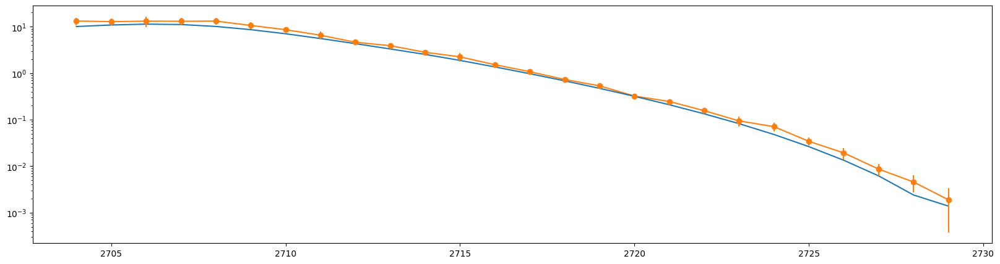

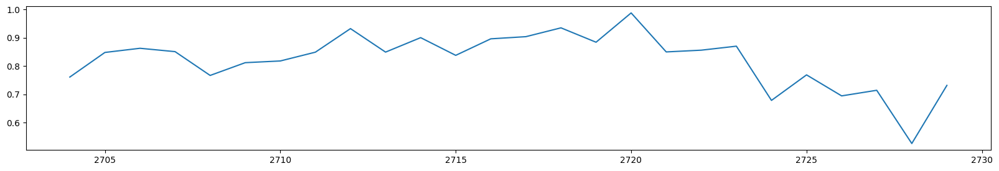

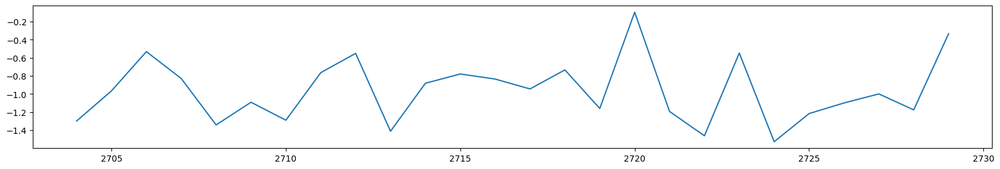

In [24]:
from matplotlib import pyplot as plt

ind_bins = np.arange(mean_pred.shape[0])[-26::]

fig, ax = plt.subplots(1,1, figsize=(20,5))
ax.plot(ind_bins, 10**mean_pred[ind_bins], label='Predicted median', color='C1')
ax.plot(ind_bins, 10**emu.Y_raw[1][ind_test[0]][ind_bins], label='True', color='C0')
ax.errorbar(ind_bins, 10**mean_pred[ind_bins], yerr=yerr[ind_bins], fmt='o', label='Predicted', color='C1')
ax.set_yscale('log')

fig, ax = plt.subplots(1,1, figsize=(20,3))
ax.plot(ind_bins, 10**emu.Y_raw[1][ind_test[0]][ind_bins]/10**mean_pred[ind_bins], label='True', color='C0')
fig, ax = plt.subplots(1,1, figsize=(20,3))
ax.plot(ind_bins, (10**emu.Y_raw[1][ind_test[0]][ind_bins]-10**mean_pred[ind_bins])/yerr[ind_bins], label='True', color='C0')

#ax.set_ylim(0.8, 1.2)

23


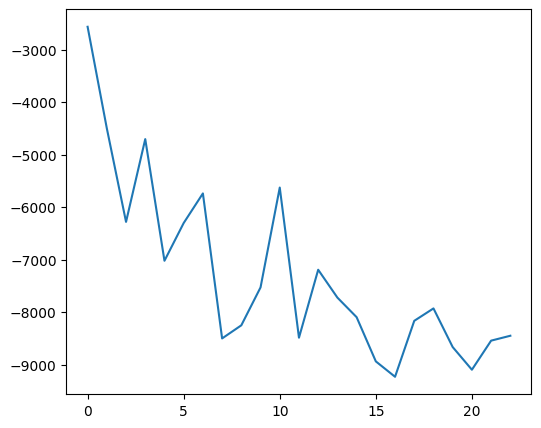

In [26]:
fig, ax = plt.subplots(1,1, figsize=(6,5))
loss = emu.model_attrs['loss_history']
print(len(loss))
ax.plot(loss)

In [28]:
emu.model_attrs

{'loss_history': [-2567.53564453125,
  -4499.8203125,
  -6280.21240234375,
  -4704.69189453125,
  -7019.85693359375,
  -6301.9658203125,
  -5738.5185546875,
  -8497.869140625,
  -8247.9755859375,
  -7526.83837890625,
  -5627.15283203125,
  -8484.125,
  -7190.845703125,
  -7721.02685546875,
  -8093.42724609375,
  -8934.58203125,
  -9227.482421875,
  -8162.8349609375,
  -7926.65966796875,
  -8662.111328125,
  -9093.3779296875,
  -8539.89453125,
  -8446.7802734375],
 'emu_type': {'wide_and_narrow': True},
 'flow_config': {'num_bijectors': 6,
  'hidden_units': (256, 256),
  'learning_rate': 0.0001,
  'num_samples': 512,
  'lr_scheduler': {'type': 'plateau',
   'gamma': 0.5,
   'step_size': 100,
   'patience': 150,
   'min_lr': 1e-06,
   'step_every': 1},
  'early_stopping': {'patience': 400, 'min_delta': 0.0001}},
 'num_samples': 512}